# **ML Model for US Housing Price Prediction using Python**

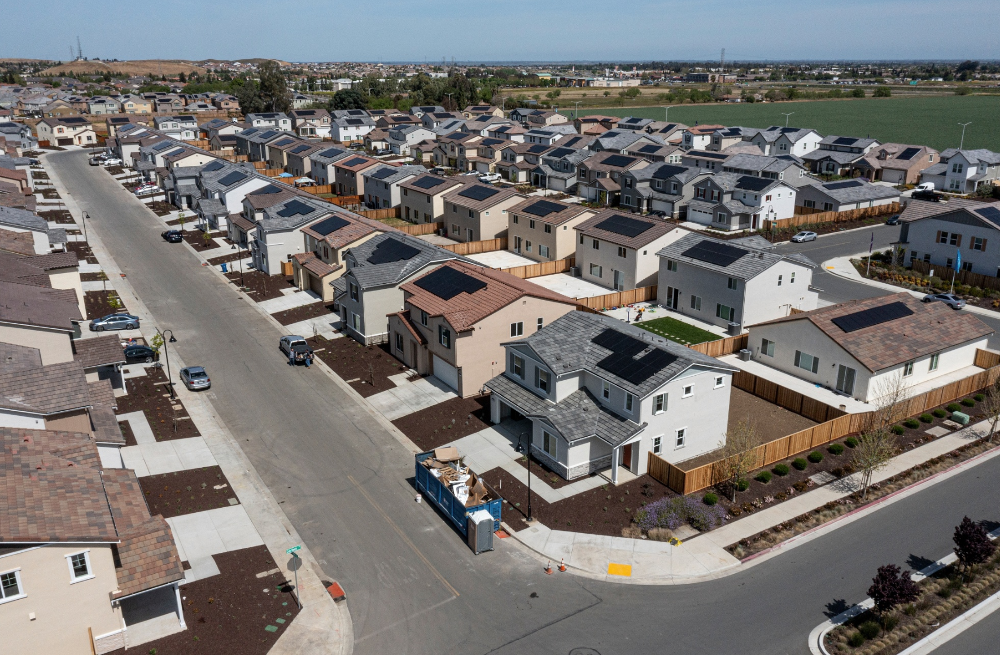

In this project, I developed a machine learning model to predict housing prices based on a given dataset. The project involved a series of steps to ensure accurate and effective analysis and prediction. Below is a detailed overview of the process:

1. Data Retrieval and Preparation:

  * Retrieved the dataset from the provided file.
  * Conducted data wrangling to clean and preprocess the data, including handling missing values and encoding categorical variables.
2. Exploratory Data Analysis (EDA):

  * Performed exploratory data analysis to understand the underlying patterns and relationships within the data.
  * Visualized key features and their distributions to gain insights and identify trends.
3. Model Development:

  * Selected and developed a machine learning model suitable for predicting housing prices.
  * Tuned model parameters and employed feature selection techniques to improve model performance.
4. Model Evaluation and Assessment:

  * Evaluated the model's performance using various metrics, such as Mean Absolute Error (MAE), Root Mean Squared Error (RMSE), and R-squared.
  * Conducted cross-validation to ensure the model's robustness and generalizability.

This structured approach allowed for a comprehensive analysis of the data and the development of a predictive model with high accuracy.

## **Data Retrieval and Preparation**

Lets install first the required libraries.

In [46]:
pip install ipywidgets

  Using cached jedi-0.19.1-py2.py3-none-any.whl.metadata (22 kB)
Using cached jedi-0.19.1-py2.py3-none-any.whl (1.6 MB)


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from matplotlib import gridspec

Then lets load the data from USA_Housing.csv.

In [2]:
USAhousing = pd.read_csv('USA_Housing.csv')
USAhousing.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\nLaurabury, NE 3701..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\nLake Kathleen, CA..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\nDanieltown, WI 06482..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\nFPO AE 09386


About the USA Housing data.
* 'Avg. Area Income': Avg. Income of residents of the city house is located in.
* 'Avg. Area House Age': Avg Age of Houses in same city
* 'Avg. Area Number of Rooms': Avg Number of Rooms for Houses in same city
* 'Avg. Area Number of Bedrooms': Avg Number of Bedrooms for Houses in same city
* 'Area Population': Population of city house is located in
* 'Price': Price that the house sold at
* 'Address': Address for the house

In [3]:
USAhousing.columns

Index(['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population', 'Price', 'Address'],
      dtype='object')

Lets check the structure of the USA housing data. First lets describe the data of the dataframe.

In [4]:
USAhousing.describe()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03
mean,68583.108984,5.977222,6.987792,3.981330,36163.516039,1.232073e+06
std,10657.991214,0.991456,1.005833,1.234137,9925.650114,3.531176e+05
min,17796.631190,2.644304,3.236194,2.000000,172.610686,1.593866e+04
25%,61480.562388,5.322283,6.299250,3.140000,29403.928702,9.975771e+05
50%,68804.286404,5.970429,7.002902,4.050000,36199.406689,1.232669e+06
75%,75783.338666,6.650808,7.665871,4.490000,42861.290769,1.471210e+06
max,107701.748378,9.519088,10.759588,6.500000,69621.713378,2.469066e+06


Then lets check the data types of the attributes of the table.

In [5]:
USAhousing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Avg. Area Income              5000 non-null   float64
 1   Avg. Area House Age           5000 non-null   float64
 2   Avg. Area Number of Rooms     5000 non-null   float64
 3   Avg. Area Number of Bedrooms  5000 non-null   float64
 4   Area Population               5000 non-null   float64
 5   Price                         5000 non-null   float64
 6   Address                       5000 non-null   object 
dtypes: float64(6), object(1)
memory usage: 273.6+ KB


## **Explanatory Data Analysis**

Now lets evaluate the data using various techniques for EDA. Lets calculate the correlations between each variable to the Class Predictor Variable

In [6]:
numeric_df = USAhousing.select_dtypes(include=[float, int])
numeric_df.corr()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price
Avg. Area Income,1.000000,-0.002007,-0.011032,0.019788,-0.016234,0.639734
Avg. Area House Age,-0.002007,1.000000,-0.009428,0.006149,-0.018743,0.452543
Avg. Area Number of Rooms,-0.011032,-0.009428,1.000000,0.462695,0.002040,0.335664
Avg. Area Number of Bedrooms,0.019788,0.006149,0.462695,1.000000,-0.022168,0.171071
Area Population,-0.016234,-0.018743,0.002040,-0.022168,1.000000,0.408556
Price,0.639734,0.452543,0.335664,0.171071,0.408556,1.000000


Lets put it in a heatmap to further understand the data.

<Axes: >

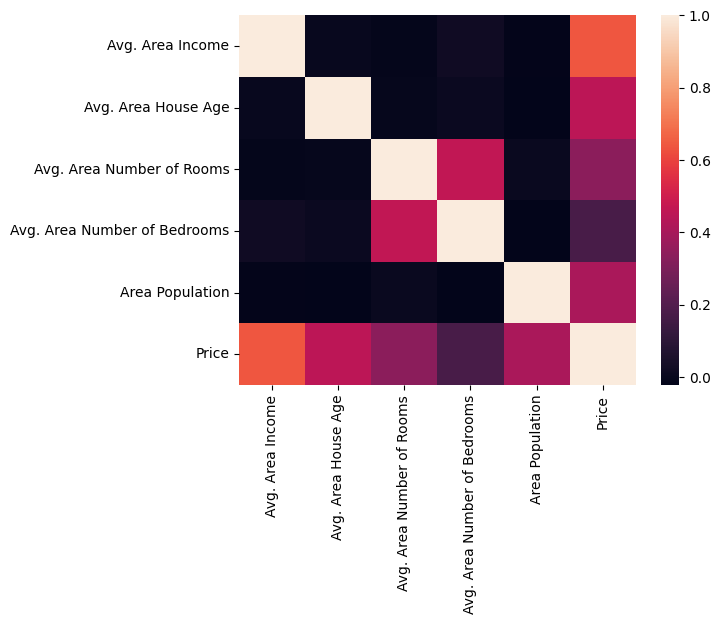

In [7]:
sns.heatmap(numeric_df.corr())

Based on the results, almost all attributes can be used for predictor variables. Now lets generate a pairplot to further check the data against the price.

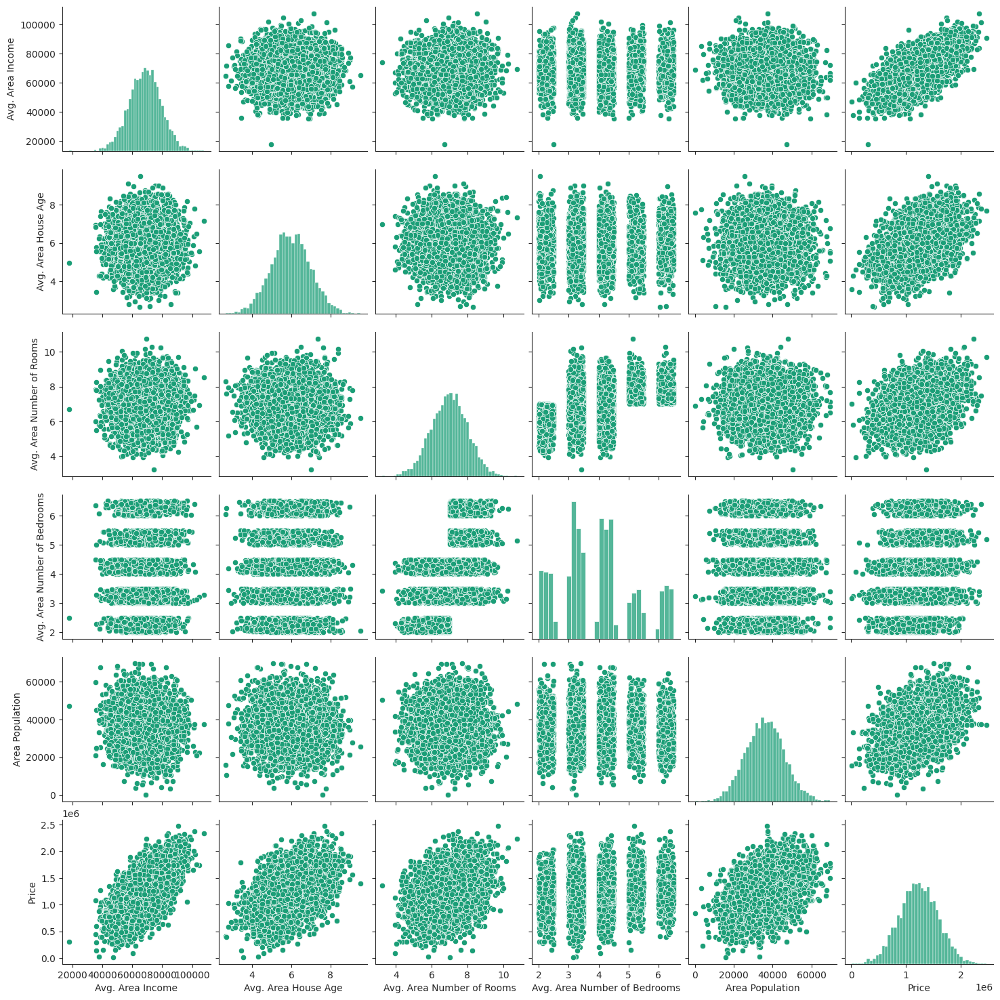

In [8]:
sns.set_palette("Dark2")
sns.set_style('ticks')
sns.pairplot(USAhousing)

Lets check the plot distribution of price across the given dataset.

<ipython-input-9-a7cd94cc3257>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(USAhousing['Price'])


<Axes: xlabel='Price', ylabel='Density'>

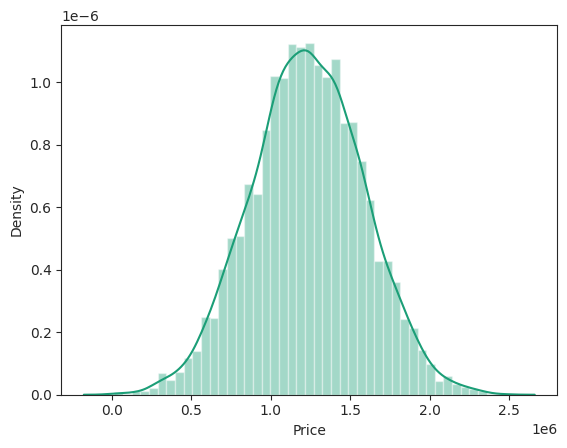

In [9]:
sns.distplot(USAhousing['Price'])

Now lets generate a jointplot per each of the attributes vs Price

In [10]:
def create_jointplots_side_by_side(data, x, y):
    """
    Create and display two joint plots side by side:
    - Scatter plot with marginal histograms
    - Hexbin plot

    Parameters:
    data (DataFrame): The data to plot.
    x (str): The column name for the x-axis.
    y (str): The column name for the y-axis.
    """
    # Create a figure with two subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'width_ratios': [1, 1]})
    scatter_jointplot = sns.jointplot(x=x, y=y, data=data, kind='scatter', height=6)
    scatter_jointplot.savefig('/tmp/scatter_jointplot.png', dpi=300)
    scatter_jointplot.fig.clf()
    hex_jointplot = sns.jointplot(x=x, y=y, data=data, kind='hex', height=6)
    hex_jointplot.savefig('/tmp/hex_jointplot.png', dpi=300)
    hex_jointplot.fig.clf()
    scatter_img = plt.imread('/tmp/scatter_jointplot.png')
    hex_img = plt.imread('/tmp/hex_jointplot.png')

    axes[0].imshow(scatter_img)
    axes[0].axis('off')
    axes[0].set_title('Scatter Plot with Marginal Histograms')
    axes[1].imshow(hex_img)
    axes[1].axis('off')
    axes[1].set_title('Hexbin Plot')
    plt.tight_layout()
    plt.show()

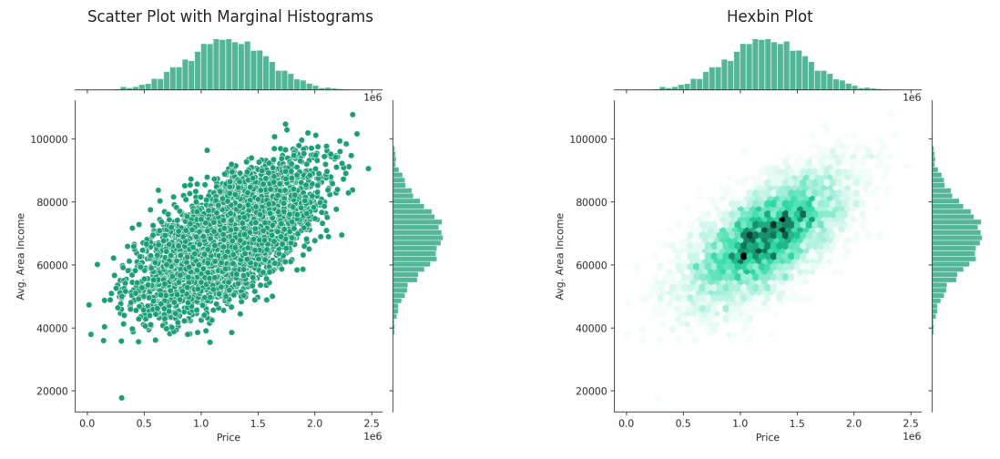

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

In [11]:
create_jointplots_side_by_side(USAhousing, 'Price', 'Avg. Area Income')

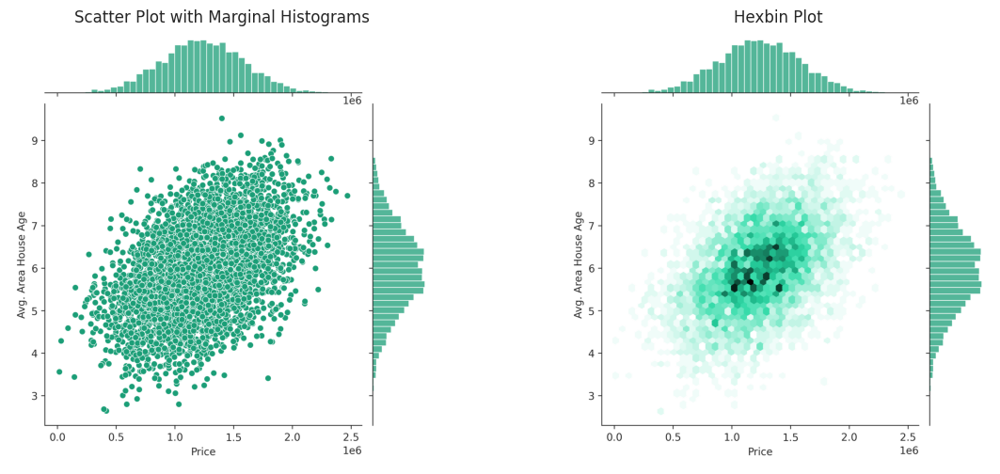

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

In [12]:
create_jointplots_side_by_side(USAhousing, 'Price', 'Avg. Area House Age')

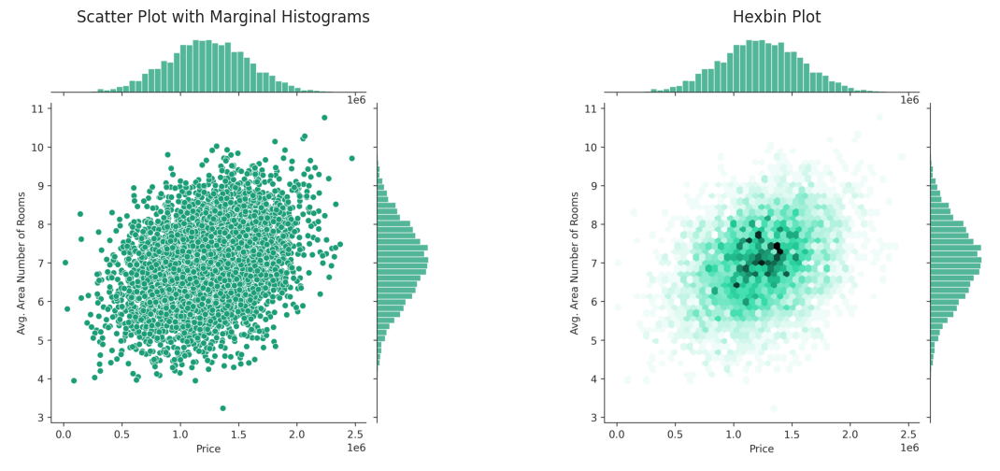

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

In [13]:
create_jointplots_side_by_side(USAhousing, 'Price', 'Avg. Area Number of Rooms')

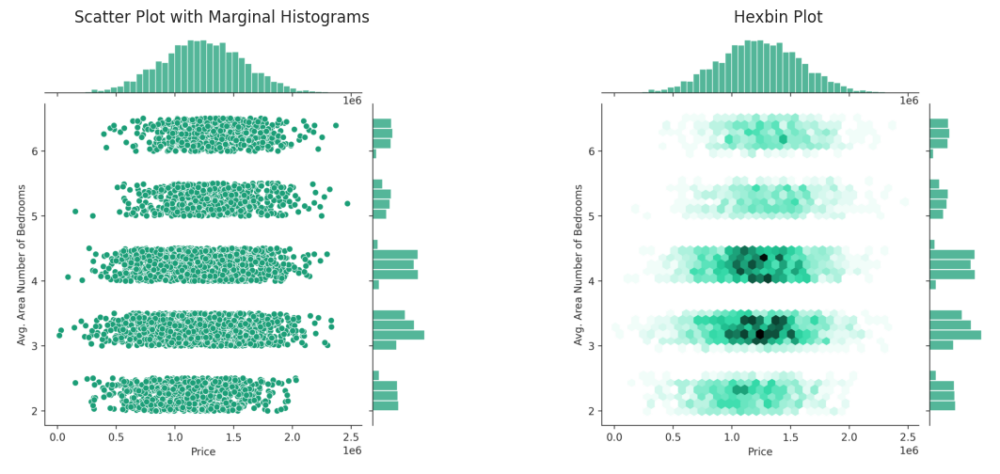

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

In [14]:
create_jointplots_side_by_side(USAhousing, 'Price', 'Avg. Area Number of Bedrooms')

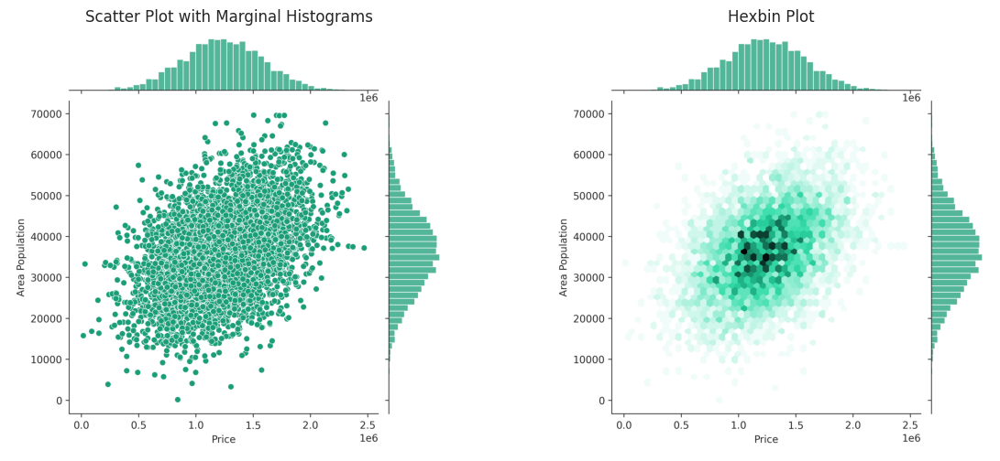

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

In [15]:
create_jointplots_side_by_side(USAhousing, 'Price', 'Area Population')

## **Model Development**

On this section, we will build multiple machine learning models to predict the housing price.
* Multi Linear Regression
* Multi Polynomial Regression
* Decision Tree Regression
* Random Forest Regression
* Gradient Boosting Machines (GBM)
* K-Nearest Neighbors (KNN)

Now, lets first split our data for model testing and training.


In [16]:
X = USAhousing[['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
               'Avg. Area Number of Bedrooms', 'Area Population']]
y = USAhousing['Price']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=101)

We can now start creating and training the models. We will use grid search to  optimize the performance of machine learning models.

**Linear Regression**

In [18]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
lm.fit(X_train,y_train)
coeff_df = pd.DataFrame(lm.coef_,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
Avg. Area Income,21.528276
Avg. Area House Age,164883.282027
Avg. Area Number of Rooms,122368.678027
Avg. Area Number of Bedrooms,2233.801864
Area Population,15.150420


**Polynomial Regression**

In [23]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
param_grid = {
    'polynomialfeatures__degree': [1, 2, 3, 4, 5, 6, 7, 8, 9]
}

pipeline = make_pipeline(PolynomialFeatures(), LinearRegression())
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X_train, y_train)
pm = grid_search.best_estimator_
pm_params = grid_search.best_params_
print(pm_params, pm)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] END .......................polynomialfeatures__degree=1; total time=   0.0s
[CV] END .......................polynomialfeatures__degree=1; total time=   0.0s
[CV] END .......................polynomialfeatures__degree=1; total time=   0.0s
[CV] END .......................polynomialfeatures__degree=1; total time=   0.0s
[CV] END .......................polynomialfeatures__degree=1; total time=   0.0s
[CV] END .......................polynomialfeatures__degree=2; total time=   0.2s
[CV] END .......................polynomialfeatures__degree=2; total time=   0.2s
[CV] END .......................polynomialfeatures__degree=2; total time=   0.1s
[CV] END .......................polynomialfeatures__degree=2; total time=   0.0s
[CV] END .......................polynomialfeatures__degree=2; total time=   0.0s
[CV] END .......................polynomialfeatures__degree=3; total time=   0.4s
[CV] END .......................polynomialfeature

**Random Forest Regression**

In [25]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

**Decision Tree**

In [26]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state=42)
dt.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

**Gradient Boosting Regressor**

In [27]:
from sklearn.ensemble import GradientBoostingRegressor
gbm = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gbm.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

**KNN Regressor**

In [28]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor()

param_grid = {
    'n_neighbors': [3, 5, 7, 9],  # Number of neighbors to use
    'weights': ['uniform', 'distance'],  # Weight function used in prediction
    'p': [1, 2]  # Power parameter for the Minkowski metric (1=Manhattan, 2=Euclidean)
}

grid_search = GridSearchCV(estimator=knn, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(X_train, y_train)
knn = grid_search.best_estimator_
knn_params = grid_search.best_params_
print(knn_params, knn)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END ................n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END ................n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END ................n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END ................n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END ................n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END ...............n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END ...............n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END ...............n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END ...............n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END ...............n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END ................n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END ................n_neighbors=3, p=2, wei

## **Model Evaluation and Assessment**

After the creation and training of the 6 models, we will now test and assess which will be the best model that will be perfectly fit the given dataset.

In [36]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import learning_curve

def evaluate_model(model, X_train, X_test, y_train, y_test, model_name, results_df=None):
    # Predict on the test set
    y_pred = model.predict(X_test)

    # Calculate evaluation metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    adjusted_r2 = 1 - (1 - r2) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)

    # Print evaluation metrics
    print(f"Model: {model_name}")
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"R-squared (R^2): {r2:.4f}")
    print(f"Adjusted R-squared: {adjusted_r2:.4f}")
    print("-" * 50)

    # Add the metrics to the DataFrame
    metrics = {
        'Model': model_name,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'R^2': r2,
        'Adjusted R^2': adjusted_r2
    }

    metrics_df = pd.DataFrame([metrics])

    if results_df is None:
        results_df = metrics_df
    else:
        results_df = pd.concat([results_df, metrics_df], ignore_index=True)

    # Create subplots for visualizations
    fig, axs = plt.subplots(2, 2, figsize=(14, 12))

    # Residual Plot
    residuals = y_test - y_pred
    sns.residplot(x=y_pred, y=residuals, lowess=True, color='blue', ax=axs[0, 0])
    axs[0, 0].set_xlabel('Predicted Values')
    axs[0, 0].set_ylabel('Residuals')
    axs[0, 0].set_title('Residual Plot')

    # Actual vs Predicted Plot
    axs[0, 1].scatter(y_test, y_pred, alpha=0.6)
    axs[0, 1].plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='red')
    axs[0, 1].set_xlabel('Actual Values')
    axs[0, 1].set_ylabel('Predicted Values')
    axs[0, 1].set_title('Actual vs Predicted Values')

    # Residual Distribution
    sns.histplot(residuals, kde=True, bins=30, color='purple', ax=axs[1, 0])
    axs[1, 0].set_xlabel('Residuals')
    axs[1, 0].set_title('Distribution of Residuals')

    # Learning Curve
    train_sizes, train_scores, test_scores = learning_curve(model, X_train, y_train, cv=5,
                                                            scoring='neg_mean_squared_error',
                                                            train_sizes=np.linspace(0.1, 1.0, 10))

    train_scores_mean = -np.mean(train_scores, axis=1)
    test_scores_mean = -np.mean(test_scores, axis=1)

    axs[1, 1].plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
    axs[1, 1].plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
    axs[1, 1].set_xlabel('Training Size')
    axs[1, 1].set_ylabel('Mean Squared Error')
    axs[1, 1].set_title('Learning Curve')
    axs[1, 1].legend(loc='best')

    plt.tight_layout()
    plt.show()

    # Feature Importance (for tree-based models)
    if hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
        indices = np.argsort(importances)[::-1]

        plt.figure(figsize=(10, 6))
        plt.bar(range(X_train.shape[1]), importances[indices], align='center')
        plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
        plt.title('Feature Importance')
        plt.show()

    return results_df

**Linear Regression**

Model: Linear Regression
Mean Squared Error (MSE): 10460958907.2090
Root Mean Squared Error (RMSE): 102278.8292
Mean Absolute Error (MAE): 82288.2225
R-squared (R^2): 0.9177
Adjusted R-squared: 0.9175
--------------------------------------------------


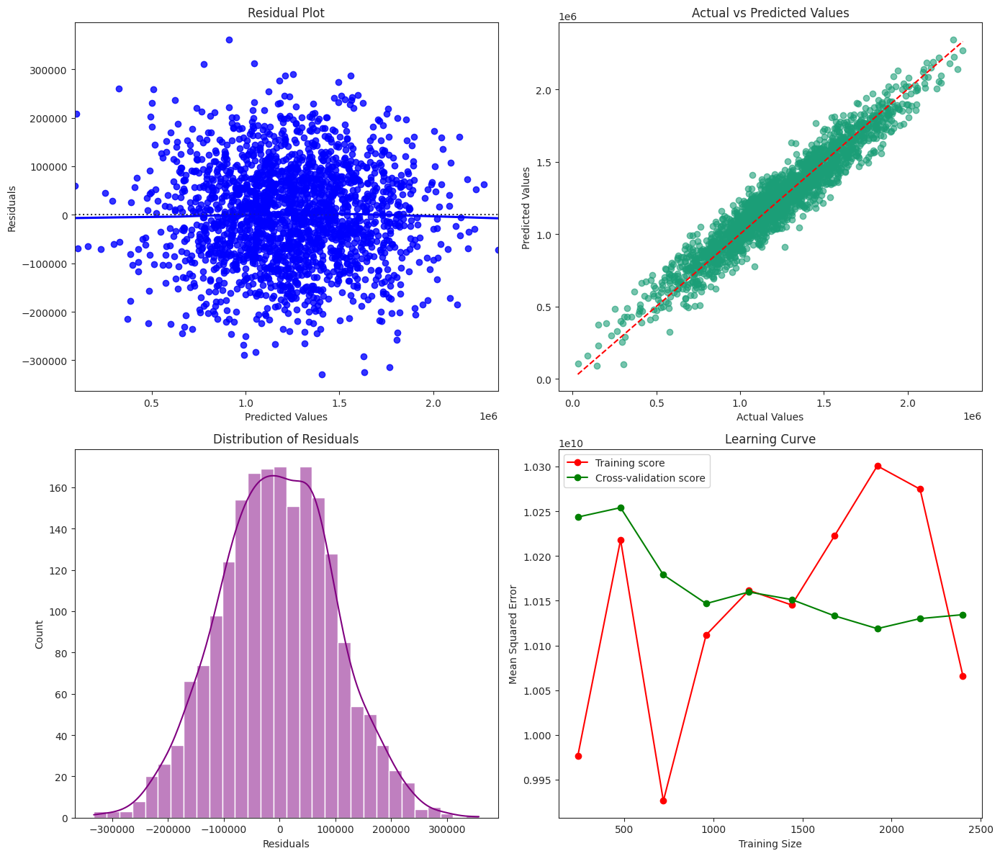

In [37]:
results_df = pd.DataFrame()
results_df = evaluate_model(lm, X_train, X_test, y_train, y_test, 'Linear Regression', results_df)

**Polynomial Regression**

Model: Polynomial Regression
Mean Squared Error (MSE): 10460958907.2093
Root Mean Squared Error (RMSE): 102278.8292
Mean Absolute Error (MAE): 82288.2225
R-squared (R^2): 0.9177
Adjusted R-squared: 0.9175
--------------------------------------------------


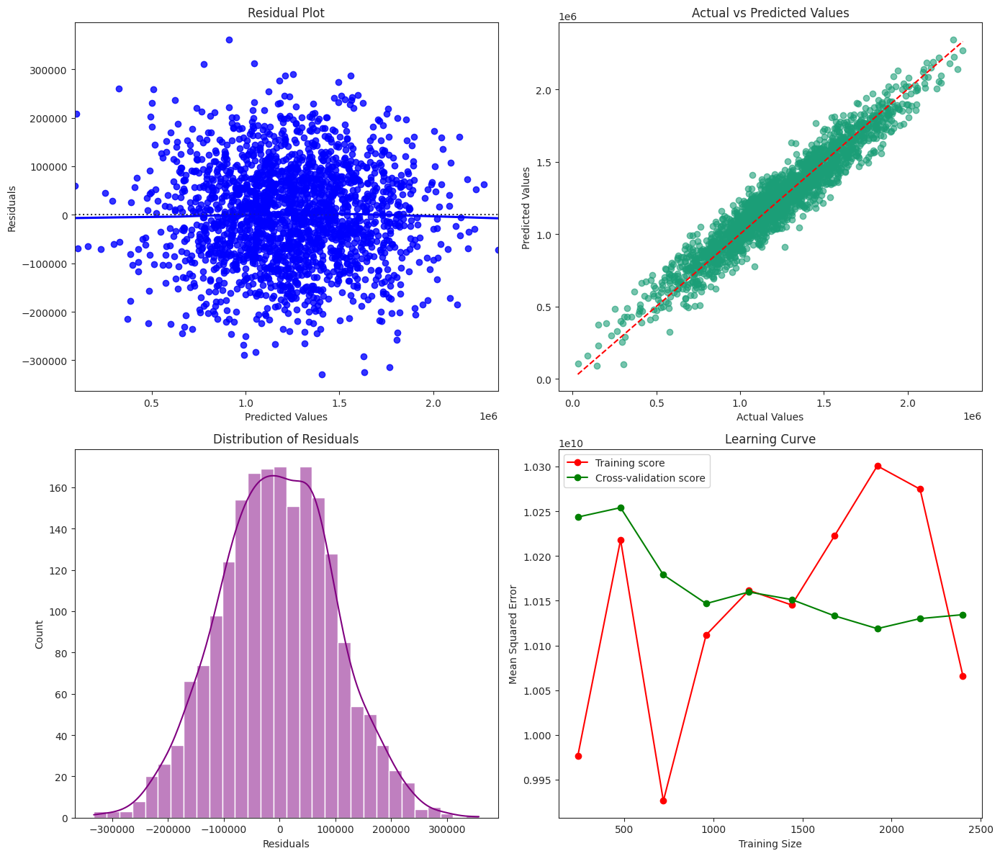

In [38]:
results_df = evaluate_model(pm, X_train, X_test, y_train, y_test, 'Polynomial Regression', results_df)

**Random Forest Regression**

Model: Random Forest Regression
Mean Squared Error (MSE): 16028904168.5189
Root Mean Squared Error (RMSE): 126605.3086
Mean Absolute Error (MAE): 99388.1933
R-squared (R^2): 0.8739
Adjusted R-squared: 0.8736
--------------------------------------------------


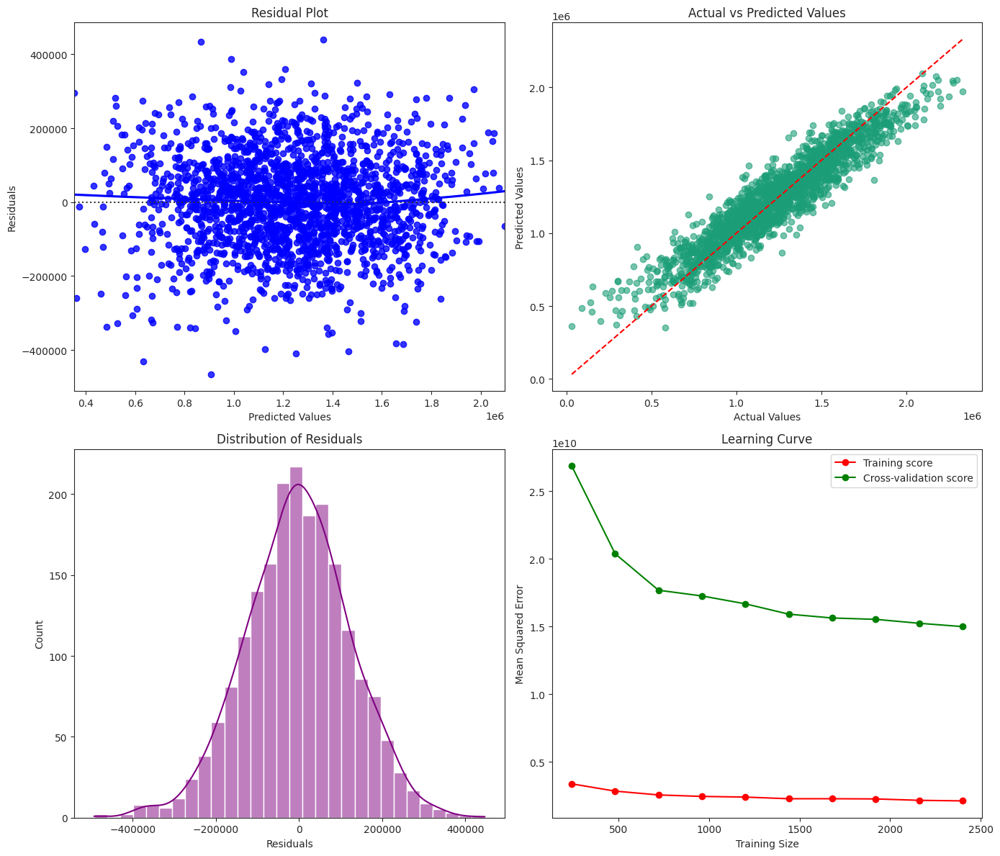

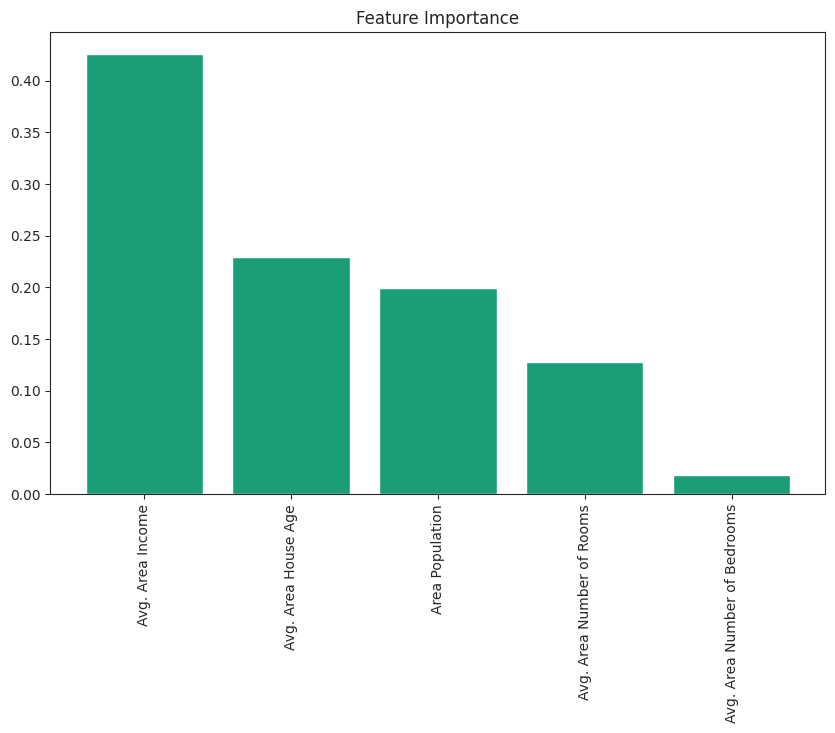

In [39]:
results_df = evaluate_model(rf, X_train, X_test, y_train, y_test, 'Random Forest Regression', results_df)

**Decision Tree**

Model: Decision Tree
Mean Squared Error (MSE): 31198969426.0460
Root Mean Squared Error (RMSE): 176632.3001
Mean Absolute Error (MAE): 139216.1234
R-squared (R^2): 0.7545
Adjusted R-squared: 0.7539
--------------------------------------------------


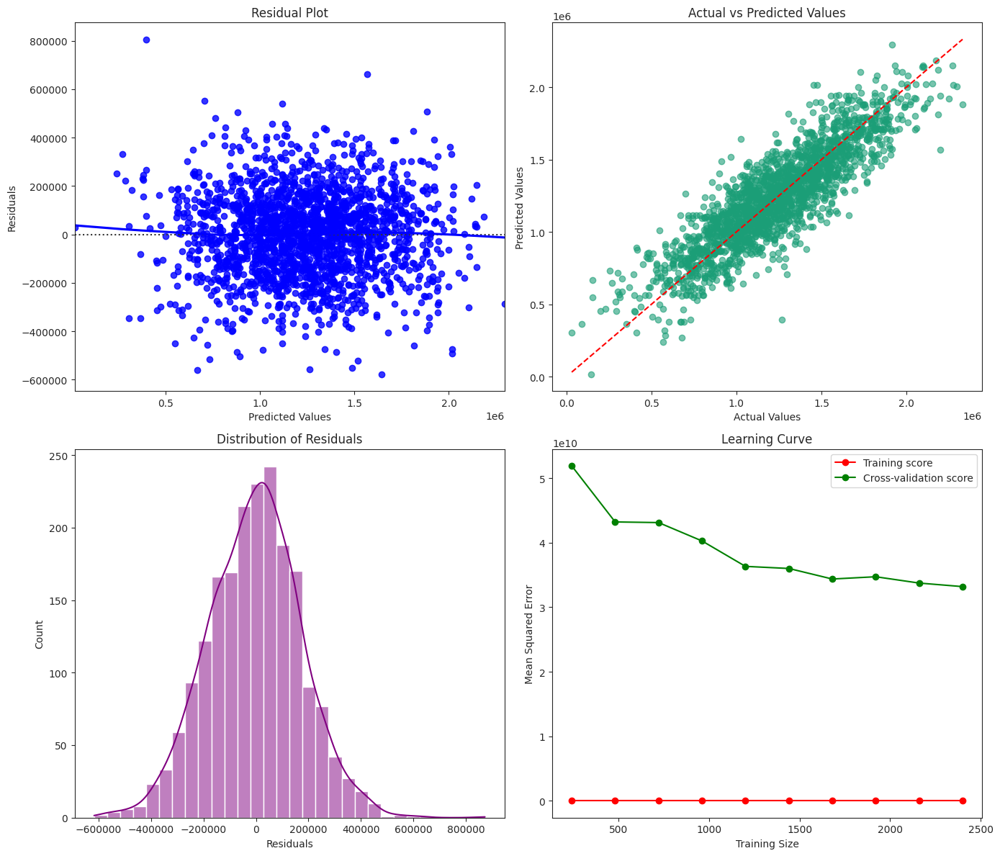

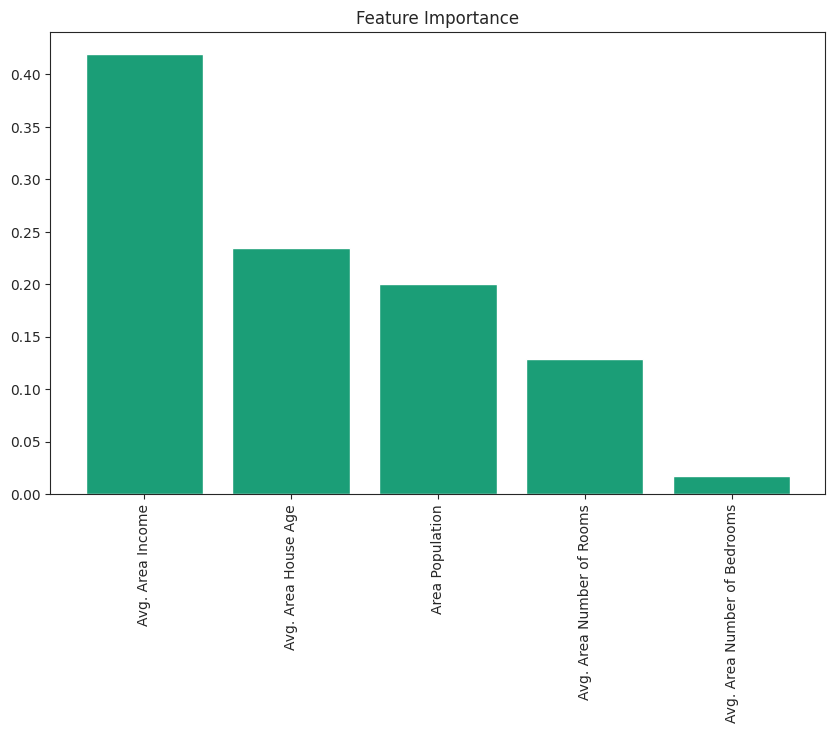

In [41]:
results_df = evaluate_model(dt, X_train, X_test, y_train, y_test, 'Decision Tree', results_df)

**Gradient Boosting Regressor**

Model: Gradient Boosting Regressor
Mean Squared Error (MSE): 12957815090.5221
Root Mean Squared Error (RMSE): 113832.3991
Mean Absolute Error (MAE): 90924.4304
R-squared (R^2): 0.8980
Adjusted R-squared: 0.8978
--------------------------------------------------


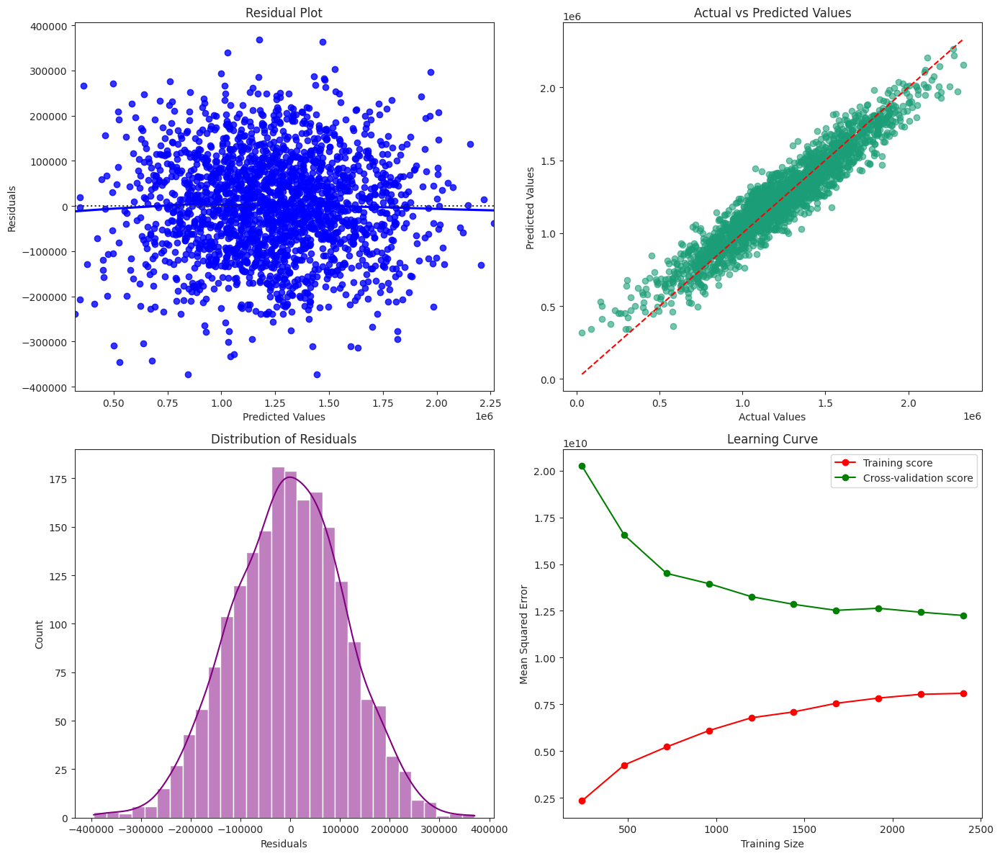

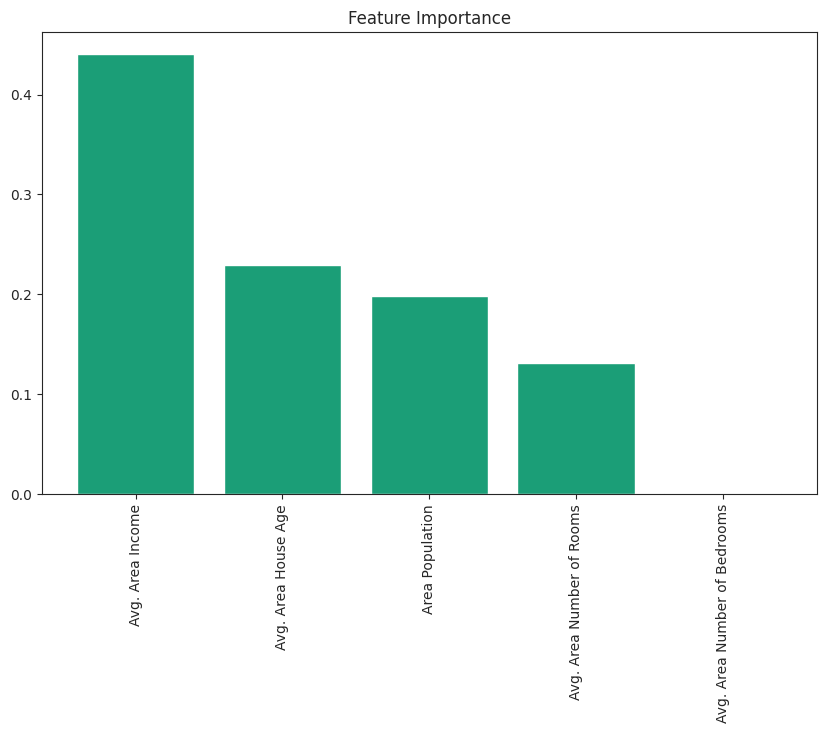

In [43]:
results_df = evaluate_model(gbm, X_train, X_test, y_train, y_test, 'Gradient Boosting Regressor', results_df)

**K-Nearest Neighbors (KNN)**

Model: KNN
Mean Squared Error (MSE): 59836691239.7475
Root Mean Squared Error (RMSE): 244615.3945
Mean Absolute Error (MAE): 196207.0063
R-squared (R^2): 0.5291
Adjusted R-squared: 0.5280
--------------------------------------------------


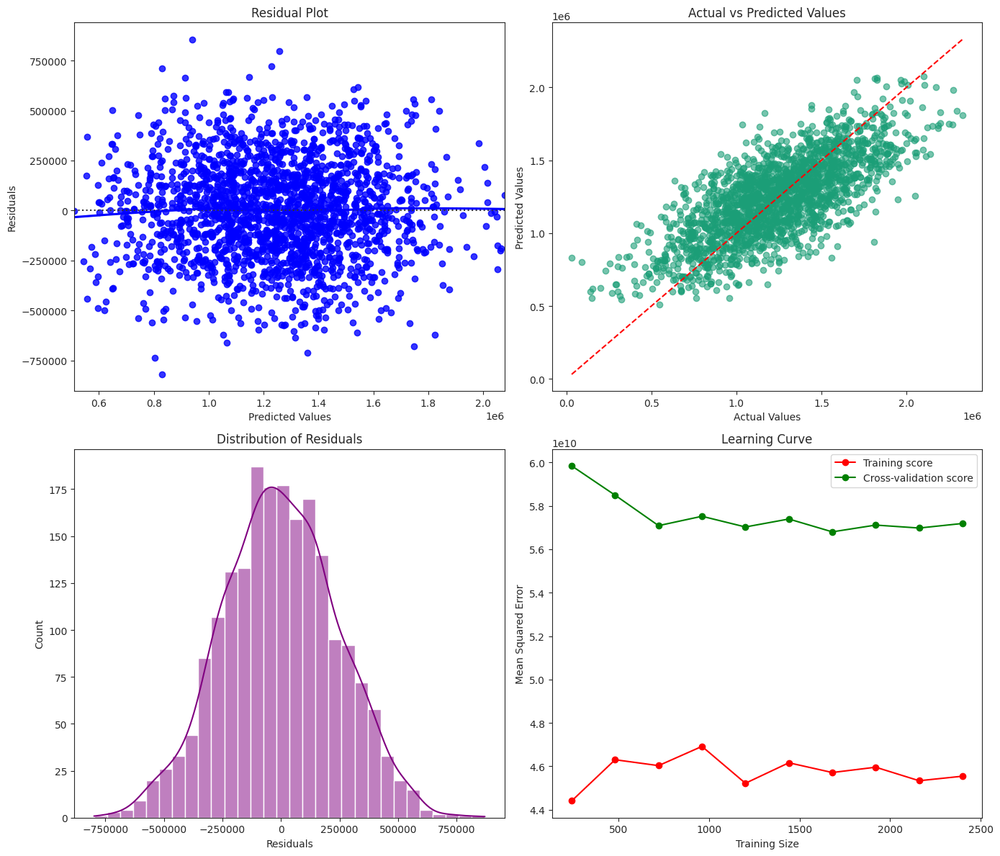

In [44]:
results_df = evaluate_model(knn, X_train, X_test, y_train, y_test, 'KNN', results_df)

Now lets check the metrics of each models and decide which will be the best model for our data.

In [45]:
results_df

,Model,MSE,RMSE,MAE,R^2,Adjusted R^2
0,Linear Regression,1.046096e+10,102278.829223,82288.222519,0.917682,0.917476
1,Polynomial Regression,1.046096e+10,102278.829223,82288.222519,0.917682,0.917476
2,Random Forest Regression,1.602890e+10,126605.308611,99388.193322,0.873868,0.873552
3,Decision Tree,3.119897e+10,176632.300064,139216.123353,0.754494,0.753879
4,Gradient Boosting Regressor,1.295782e+10,113832.399125,90924.430410,0.898035,0.897779
5,KNN,5.983669e+10,244615.394527,196207.006291,0.529143,0.527963


Given the above results, Linear Regression and Polynomial Regression are the best models based on the provided metrics, as they offer the best balance of accuracy and error minimization. However, the degree of polynomial regression is 1. With this reaeson, Linear Regression will be the model to be used.

**Simple UI using the evaluated model**

In [47]:
import ipywidgets as widgets
from IPython.display import display

# Define a function for making predictions
def predict_price(avg_area_income, avg_area_house_age, avg_area_num_rooms,
                  avg_area_num_bedrooms, area_population):
    # Prepare the input data
    input_data = pd.DataFrame({
        'Avg. Area Income': [avg_area_income],
        'Avg. Area House Age': [avg_area_house_age],
        'Avg. Area Number of Rooms': [avg_area_num_rooms],
        'Avg. Area Number of Bedrooms': [avg_area_num_bedrooms],
        'Area Population': [area_population]
    })

    # Predict using the Linear Regression model
    predicted_price = lm.predict(input_data)

    return predicted_price[0]

# Define the interactive widgets
avg_area_income = widgets.FloatText(value=50000, description='Avg. Area Income:')
avg_area_house_age = widgets.FloatText(value=10, description='Avg. Area House Age:')
avg_area_num_rooms = widgets.IntText(value=3, description='Avg. Area Number of Rooms:')
avg_area_num_bedrooms = widgets.IntText(value=2, description='Avg. Area Number of Bedrooms:')
area_population = widgets.FloatText(value=100000, description='Area Population:')

# Create a button to make prediction
predict_button = widgets.Button(description='Predict Price')

# Define the function to be called when the button is clicked
def on_predict_button_clicked(b):
    price = predict_price(
        avg_area_income.value,
        avg_area_house_age.value,
        avg_area_num_rooms.value,
        avg_area_num_bedrooms.value,
        area_population.value
    )
    print(f"Predicted Price: ${price:,.2f}")

predict_button.on_click(on_predict_button_clicked)

# Display the widgets
display(avg_area_income, avg_area_house_age, avg_area_num_rooms, avg_area_num_bedrooms, area_population, predict_button)

FloatText(value=50000.0, description='Avg. Area Income:')

FloatText(value=10.0, description='Avg. Area House Age:')

IntText(value=3, description='Avg. Area Number of Rooms:')

IntText(value=2, description='Avg. Area Number of Bedrooms:')

FloatText(value=100000.0, description='Area Population:')

Button(description='Predict Price', style=ButtonStyle())

Predicted Price: $1,971,702.44
